# IK Tau NaCl plots
---

In [1]:
import matplotlib.pyplot as plt
import numpy             as np
import torch

from torch.optim            import Adam
from tqdm                   import tqdm
from astropy                import units, constants
from ipywidgets             import interact

from pomme.utils         import convert_angular_to_spatial
from pomme.plot          import plot_cube_2D, plot_spectrum
from pomme.object        import AstroObject
from pomme.observation   import DataCube, Beam
from pomme.model         import TensorModel
from pomme.utils         import print_var, interpolate, convert_angular_to_spatial, planck, T_CMB
from pomme.lines         import Line
from pomme.loss          import Loss, SphericalLoss, diff_loss 
from pomme.hydrodynamics import Hydrodynamics

import k3d

In [2]:
model = TensorModel.load('IK_Tau_NaCl_fit.h5')

rho = torch.exp(model['log_NaCl']).data.numpy().astype(np.float32)

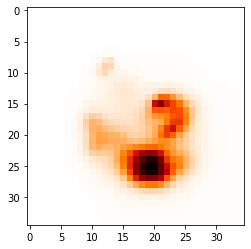

In [3]:
plt.imshow(rho.sum(axis=2), cmap='gist_heat_r')

In [4]:
model.shape

(35, 35, 64)

In [5]:
model.sizes

array([5.46034568e+13, 5.46034568e+13, 5.46034568e+13])

TypeError: 'AxesSubplot' object is not callable

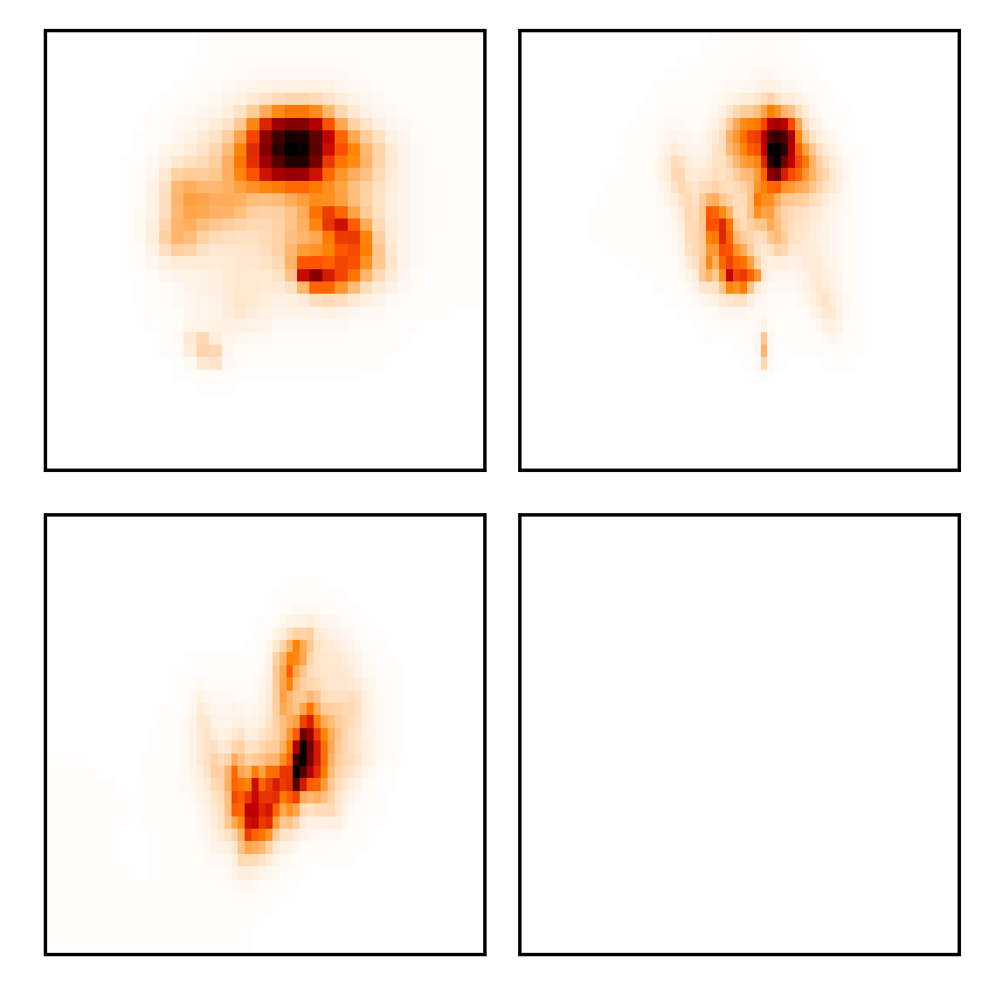

In [6]:
fig, axes = plt.subplots(
    nrows       =   2,
    ncols       =   2,
    dpi         = 350,
    # sharex      = True,
    # sharey      = True,
    figsize     = (4, 4),
    gridspec_kw = {'wspace':0.00, 'hspace':0.1},
    # layout      = 'constrained'
)

axes[0,0].imshow(rho.sum(axis=2)[::-1,::+1], cmap='gist_heat_r')
axes[0,1].imshow(rho.sum(axis=1)[::-1,::-1], cmap='gist_heat_r')
axes[1,0].imshow(rho.sum(axis=0)[::+1,::-1], cmap='gist_heat_r')

# axes[0,0].imshow(rho.sum(axis=2)[::-1,::+1], cmap='CMRmap')
# axes[0,1].imshow(rho.sum(axis=1)[::-1,::-1], cmap='gnuplot2_r')
# axes[1,0].imshow(rho.sum(axis=0)[::+1,::-1], cmap='gnuplot2_r')

# axes[0,0].set_axis_off()
# axes[1,0].set_axis_off()
# axes[0,1].set_axis_off()

axes[0,0].set_xticks([])
axes[0,1].set_xticks([])
axes[1,0].set_xticks([])
axes[1,1].set_xticks([])

axes[0,0].set_yticks([])
axes[0,1].set_yticks([])
axes[1,0].set_yticks([])
axes[1,1].set_yticks([])

axes[0,0].set_aspect('equal')
axes[0,1].set_aspect(64/35)
axes[1,0].set_aspect(64/35)
axes[1,1].set_aspect('equal')


# prepare some coordinates
x, y, z = np.indices((8, 8, 8))

# draw cuboids in the top left and bottom right corners, and a link between
# them
cube1 = (x < 3) & (y < 3) & (z < 3)
cube2 = (x >= 5) & (y >= 5) & (z >= 5)
link = abs(x - y) + abs(y - z) + abs(z - x) <= 2

# combine the objects into a single boolean array
voxelarray = cube1 | cube2 | link

# set the colors of each object
colors = np.empty(voxelarray.shape, dtype=object)
colors[link] = 'red'
colors[cube1] = 'blue'
colors[cube2] = 'green'

# and plot everything
ax = axes[1,1](projection='3d')
axes[1,1].voxels(voxelarray, facecolors=colors, edgecolor='k')    

# axes[4,0].set_xlabel('x [au]')
# axes[4,0].set_ylabel('y [au]')

# fig.colorbar(pcm, ax=ax, location='right', shrink=1.0, pad=0.05, label='Intensity [log$_{10}$(W m$^{-2}$ Hz$^{-1}$)]')

plt.savefig('IKTau_render.png', dpi=360)

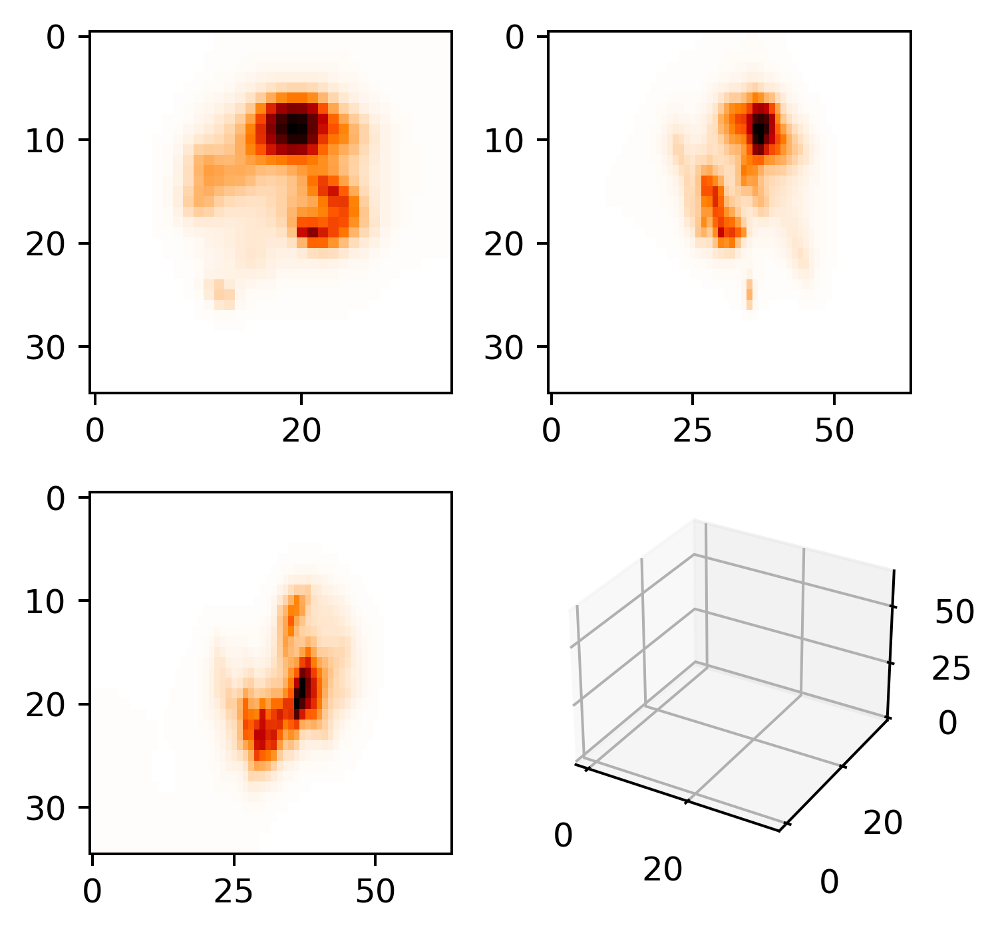

In [ ]:
# fig, axes = plt.subplots(
#     nrows       =   2,
#     ncols       =   2,
#     dpi         = 350,
#     # sharex      = True,
#     # sharey      = True,
#     figsize     = (4, 4),
#     gridspec_kw = {'wspace':0.00, 'hspace':0.1},
#     # layout      = 'constrained'
# )

fig = plt.figure(figsize=(4,4), dpi=360)

ax = fig.add_subplot(2,2,1)
ax.imshow(rho.sum(axis=2)[::-1,::+1], cmap='gist_heat_r')
ax.set_aspect('equal')

ax = fig.add_subplot(2,2,2)
ax.imshow(rho.sum(axis=1)[::-1,::-1], cmap='gist_heat_r')
ax.set_aspect(64/35)

ax = fig.add_subplot(2,2,3)
ax.imshow(rho.sum(axis=0)[::+1,::-1], cmap='gist_heat_r')
ax.set_aspect(64/35)

# axes[0,0].imshow(rho.sum(axis=2)[::-1,::+1], cmap='CMRmap')
# axes[0,1].imshow(rho.sum(axis=1)[::-1,::-1], cmap='gnuplot2_r')
# axes[1,0].imshow(rho.sum(axis=0)[::+1,::-1], cmap='gnuplot2_r')

# axes[0,0].set_axis_off()
# axes[1,0].set_axis_off()
# axes[0,1].set_axis_off()

# axes[0,0].set_xticks([])
# axes[0,1].set_xticks([])
# axes[1,0].set_xticks([])
# axes[1,1].set_xticks([])

# axes[0,0].set_yticks([])
# axes[0,1].set_yticks([])
# axes[1,0].set_yticks([])
# axes[1,1].set_yticks([])

# axes[0,0].set_aspect('equal')
# axes[0,1].set_aspect(64/35)
# axes[1,0].set_aspect(64/35)
# axes[1,1].set_aspect('equal')


# prepare some coordinates
# x, y, z = np.indices((8, 8, 8))

# # draw cuboids in the top left and bottom right corners, and a link between
# # them
# cube1 = (x < 3) & (y < 3) & (z < 3)
# cube2 = (x >= 5) & (y >= 5) & (z >= 5)
# link = abs(x - y) + abs(y - z) + abs(z - x) <= 2

# # combine the objects into a single boolean array
# voxelarray = cube1 | cube2 | link

# # set the colors of each object
# colors = np.empty(voxelarray.shape, dtype=object)
# colors[link] = 'red'
# colors[cube1] = 'blue'
# colors[cube2] = 'green'

# and plot everything
ax = fig.add_subplot(2,2,4, projection='3d')
ax.voxels(voxels, facecolors=colors)    

# axes[4,0].set_xlabel('x [au]')
# axes[4,0].set_ylabel('y [au]')

# fig.colorbar(pcm, ax=ax, location='right', shrink=1.0, pad=0.05, label='Intensity [log$_{10}$(W m$^{-2}$ Hz$^{-1}$)]')

fig.tight_layout()

plt.savefig('IKTau_render.png', dpi=360)

In [ ]:
rho_norm = (rho - rho.min())/(rho.max()-rho.min())
rho_norm.shape

(35, 35, 64)

In [ ]:
import matplotlib as mpl

cmap = mpl.colormaps['gist_heat_r']

colors = cmap(rho_norm)
colors[np.sqrt(colors[:,:,:,0]**2 + colors[:,:,:,1]**2 + colors[:,:,:,2]**2) >  0.99*np.sqrt(3)] = np.array([1,1,1,0])
colors[np.sqrt(colors[:,:,:,0]**2 + colors[:,:,:,1]**2 + colors[:,:,:,2]**2) <= 0.99*np.sqrt(3)] = np.array([0,0,0,1])

In [ ]:
colors[:,:,:,3

(array([74701.,     0.,     0.,     0.,     0.,     0.,     0.,     0.,
            0.,  3699.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <BarContainer object of 10 artists>)

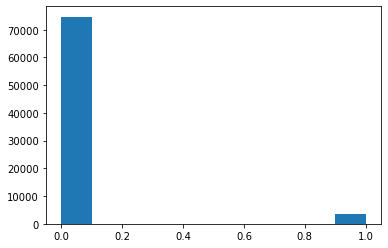

In [ ]:
plt.hist(colors[:,:,:,3].ravel())

In [ ]:
np.sum(colors[:,:,:,0] == 1) / colors.size

0.24977040816326532

(array([1.76000e+02, 5.00000e+00, 0.00000e+00, 1.00000e+00, 5.00000e+00,
        4.00000e+00, 0.00000e+00, 6.00000e+00, 1.00000e+00, 9.00000e+00,
        7.84090e+04, 3.00000e+00, 9.00000e+00, 3.00000e+00, 0.00000e+00,
        9.00000e+00, 5.00000e+00, 1.00000e+00, 7.00000e+00, 2.00000e+00,
        9.00000e+00, 4.00000e+00, 1.00000e+00, 9.00000e+00, 9.00000e+00,
        3.00000e+00, 7.00000e+00, 9.00000e+00, 4.00000e+00, 5.00000e+00,
        1.40000e+01, 3.00000e+00, 6.00000e+00, 7.00000e+00, 7.00000e+00,
        1.80000e+01, 3.00000e+00, 1.30000e+01, 1.60000e+01, 1.00000e+00,
        1.10000e+01, 1.80000e+01, 7.00000e+00, 1.50000e+01, 5.00000e+00,
        1.80000e+01, 1.40000e+01, 4.00000e+00, 1.30000e+01, 1.50000e+01,
        5.00000e+00, 1.00000e+01, 2.60000e+01, 6.00000e+00, 3.10000e+01,
        9.00000e+00, 2.80000e+01, 2.60000e+01, 3.00000e+00, 2.70000e+01,
        3.20000e+01, 1.00000e+01, 2.70000e+01, 3.10000e+01, 5.00000e+00,
        3.90000e+01, 4.00000e+00, 4.00000e+01, 4.50

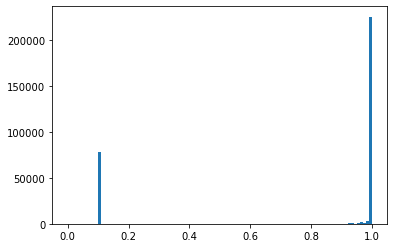

In [ ]:
plt.hist(colors.ravel(), bins=100)

In [ ]:
voxels = np.ones(dtype=bool, shape=rho.shape)

In [ ]:
colors = np.empty(voxels.shape, dtype=object)
colors[link] = 'red'
colors[cube1] = 'blue'
colors[cube2] = 'green'


In [ ]:
voxelarray.shape

(8, 8, 8)

In [ ]:
model.sizes / (1.0 * units.au).si.value

array([365.0015643, 365.0015643, 365.0015643])

In [ ]:
rho.max() / 1.0e+6

8.523123

In [54]:
origin = np.array([18.1346117, 20.49441416, 32.0])
R_star = 380000000000.0

star_location = (origin/rho.shape-0.5).astype(np.float32)
star_radius   = R_star/np.mean(model.sizes)

plt_volume = k3d.volume(
    volume      = rho / 1.0e+6,
    alpha_coef  = 30,
    # color_range = [0, 5000000]
    color_range = [0, 5],
    # name = 'density'
)
plt_star   = k3d.points(
    positions  = [star_location],
    point_size = star_radius,
    color      = 0x0047AB
)

plot  = k3d.plot()
plot += plt_volume
plot += plt_star
plot.display()

Output()

In [55]:
plot.colorbar_scientific=True

In [56]:
plot.grid_visible = False
plot.camera       = plot.get_auto_camera(factor=0.5, yaw=0, pitch=90)

In [29]:
plot.grid_visible = False
plot.camera       = plot.get_auto_camera(factor=0.5, yaw=90, pitch=90)

In [47]:
plot.grid_visible = False
plot.camera       = plot.get_auto_camera(factor=0.5, yaw=0, pitch=180)

In [13]:
plot.grid_visible = False
plot.camera       = plot.get_auto_camera(factor=0.5, yaw=25, pitch=75)

In [63]:
plot.screenshot

''

In [59]:
image = plot.screenshot()

TypeError: 'str' object is not callable

In [74]:
plot.yield_screenshots()

TypeError: yield_screenshots() missing 1 required positional argument: 'generator_function'

In [74]:
rho.min()

1727.5955

In [87]:
rho.max()

8523123.0

In [127]:
import plotly.graph_objects as go

X, Y, Z = model.get_coords()
values  = rho

crit = np.ones_like(values, dtype=bool) # values > 5.0 * values.min()

X_lim      = X     [crit]
Y_lim      = Y     [crit]
Z_lim      = Z     [crit]
values_lim = values[crit]


fig = go.Figure(data=go.Volume(
    x=X_lim.flatten(),
    y=Y_lim.flatten(),
    z=Z_lim.flatten(),
    value=values_lim.flatten(),
    # isomin=0.5*rho.min(),
    # isomax=rho.max(),
    opacity=0.1, # needs to be small to see through all surfaces
    # opacityscale=[[0, 0], [1, 0.01*rho.max()]],
    surface_count=50, # needs to be a large number for good volume rendering
    colorscale='magma'
    ))
fig.show()

In [65]:
X

array([[[-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ],
        [-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ],
        [-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ],
        ...,
        [-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ],
        [-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ],
        [-8.        , -8.        , -8.        , ..., -8.        ,
         -8.        , -8.        ]],

       [[-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
         -7.58974359, -7.58974359],
        [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
         -7.58974359, -7.58974359],
        [-7.58974359, -7.58974359, -7.58974359, ..., -7.58974359,
         -7.58974359, -7.58974359],
        ...,
        [-7.58974359, -7.58974359, -7.58974359, ..., -